# **Garbage In Garbage Out!!**
### 쓰레기를 넣으면 쓰레기가 나온다! 데이터의 품질이 중요하다!!


# Neural Network
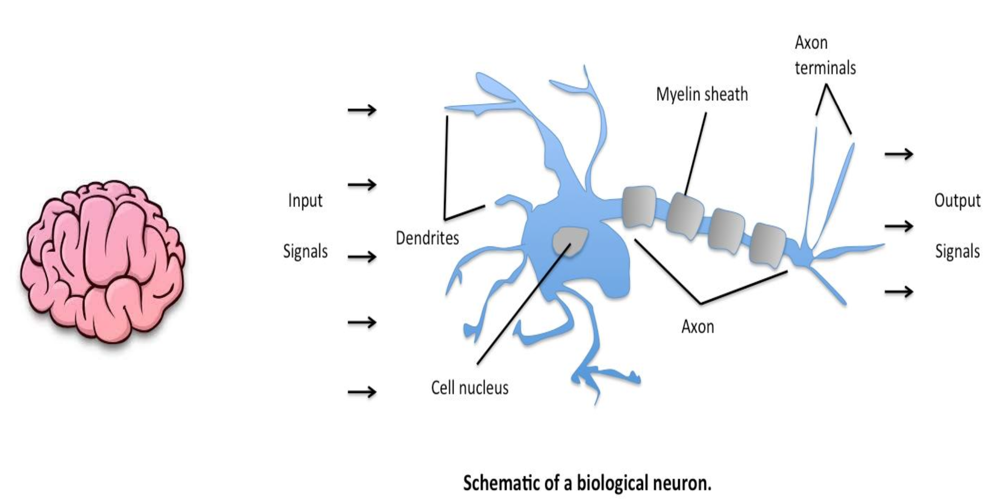

## Activation Function
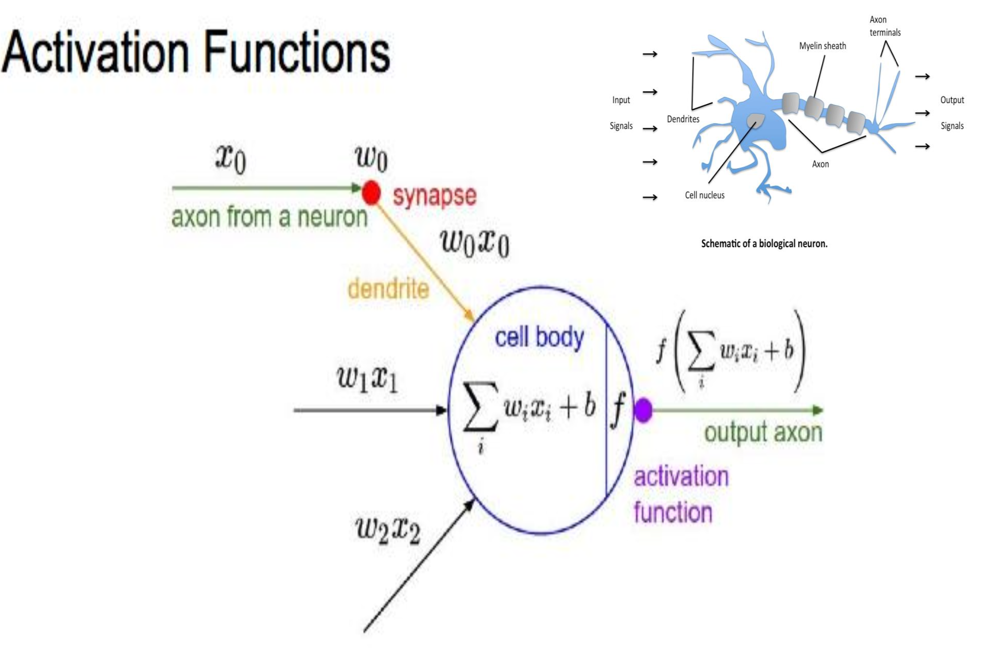

In [3]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, SimpleRNN
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

model = Sequential()

# 입력, 히든 계층은 주로 활성화 함수로 relu가 사용됨
# model.add(Dense(2, input_dim=3))
model.add(Dense(8, input_dim=4, activation='relu')) # 4*8 + 8 = 40
model.add(Dense(6, activation='relu')) # 8*6 + 6 = 54
model.add(Dense(3, activation='softmax')) # 6*3 + 3 = 21


In [4]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8)                 40        
                                                                 
 dense_1 (Dense)             (None, 6)                 54        
                                                                 
 dense_2 (Dense)             (None, 3)                 21        
                                                                 
Total params: 115
Trainable params: 115
Non-trainable params: 0
_________________________________________________________________


In [5]:
tok = Tokenizer()

In [6]:
train = 'Can I look around?'

In [7]:
tok.fit_on_texts([train]) # Voc 생성

In [8]:
tok.index_word

{1: 'can', 2: 'i', 3: 'look', 4: 'around'}

In [9]:
# 새로운 문장을 인코딩
text = 'Can I look at my phone after lasik'

In [10]:
seq = tok.texts_to_sequences([text])[0]
seq

[1, 2, 3]

In [11]:
pad_sequences([[1,2,3],[2,3],[3,4,5,6]], maxlen=3)
pad_sequences([[1,2,3],[2,3],[3,4,5,6]], maxlen=3, padding='post')
pad_sequences([[1,2,3],[2,3],[3,4,5,6]], maxlen=3, padding='pre')

array([[1, 2, 3],
       [0, 2, 3],
       [4, 5, 6]], dtype=int32)

# **워드 임베딩**

- 원 핫 인코딩 : 메모리를 많이 차지(= sparse vector), 대부분 0 또는 1
- 임베딩 벡터 : 메모리 적게 차지, 실수로 구성  
ex) 1만 차원 원핫 벡터 -> 10차원 임베딩벡터  
model.add(Embedding(1만(vocab_size), 10(output_dim), 3(입력길이))  



In [12]:
import pandas as pd
from sklearn.datasets import fetch_20newsgroups
import matplotlib.pyplot as plt
from tensorflow.keras.utils import to_categorical

- ploty.com
- matplotlib.org
- tableau.com
- folium.org
- seaborn, pandas

In [13]:
news = fetch_20newsgroups(subset='train')

In [14]:
news


{'data': ["From: lerxst@wam.umd.edu (where's my thing)\nSubject: WHAT car is this!?\nNntp-Posting-Host: rac3.wam.umd.edu\nOrganization: University of Maryland, College Park\nLines: 15\n\n I was wondering if anyone out there could enlighten me on this car I saw\nthe other day. It was a 2-door sports car, looked to be from the late 60s/\nearly 70s. It was called a Bricklin. The doors were really small. In addition,\nthe front bumper was separate from the rest of the body. This is \nall I know. If anyone can tellme a model name, engine specs, years\nof production, where this car is made, history, or whatever info you\nhave on this funky looking car, please e-mail.\n\nThanks,\n- IL\n   ---- brought to you by your neighborhood Lerxst ----\n\n\n\n\n",
  "From: guykuo@carson.u.washington.edu (Guy Kuo)\nSubject: SI Clock Poll - Final Call\nSummary: Final call for SI clock reports\nKeywords: SI,acceleration,clock,upgrade\nArticle-I.D.: shelley.1qvfo9INNc3s\nOrganization: University of Washingto

In [15]:
news.keys()

dict_keys(['data', 'filenames', 'target_names', 'target', 'DESCR'])

In [16]:
news.data

["From: lerxst@wam.umd.edu (where's my thing)\nSubject: WHAT car is this!?\nNntp-Posting-Host: rac3.wam.umd.edu\nOrganization: University of Maryland, College Park\nLines: 15\n\n I was wondering if anyone out there could enlighten me on this car I saw\nthe other day. It was a 2-door sports car, looked to be from the late 60s/\nearly 70s. It was called a Bricklin. The doors were really small. In addition,\nthe front bumper was separate from the rest of the body. This is \nall I know. If anyone can tellme a model name, engine specs, years\nof production, where this car is made, history, or whatever info you\nhave on this funky looking car, please e-mail.\n\nThanks,\n- IL\n   ---- brought to you by your neighborhood Lerxst ----\n\n\n\n\n",
 "From: guykuo@carson.u.washington.edu (Guy Kuo)\nSubject: SI Clock Poll - Final Call\nSummary: Final call for SI clock reports\nKeywords: SI,acceleration,clock,upgrade\nArticle-I.D.: shelley.1qvfo9INNc3s\nOrganization: University of Washington\nLines: 

In [17]:
len(news.data)

11314

In [18]:
news.target_names

['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

In [19]:
news.data[9]

"From: kerr@ux1.cso.uiuc.edu (Stan Kerr)\nSubject: Re: Sigma Designs Double up??\nArticle-I.D.: ux1.C52u8x.B62\nOrganization: University of Illinois at Urbana\nLines: 29\n\njap10@po.CWRU.Edu (Joseph A. Pellettiere) writes:\n\n\n>\tI am looking for any information about the Sigma Designs\n>\tdouble up board.  All I can figure out is that it is a\n>\thardware compression board that works with AutoDoubler, but\n>\tI am not sure about this.  Also how much would one cost?\n\nI've had the board for over a year, and it does work with Diskdoubler,\nbut not with Autodoubler, due to a licensing problem with Stac Technologies,\nthe owners of the board's compression technology. (I'm writing this\nfrom memory; I've lost the reference. Please correct me if I'm wrong.)\n\nUsing the board, I've had problems with file icons being lost, but it's\nhard to say whether it's the board's fault or something else; however,\nif I decompress the troubled file and recompress it without the board,\nthe icon usuall

In [20]:
news.target_names
news.target_names[4]

'comp.sys.mac.hardware'

In [21]:
news.data
#1. From : 부터 Subject : 사이의 이메일 주소 추출하기. str.extract(정규표현식)

["From: lerxst@wam.umd.edu (where's my thing)\nSubject: WHAT car is this!?\nNntp-Posting-Host: rac3.wam.umd.edu\nOrganization: University of Maryland, College Park\nLines: 15\n\n I was wondering if anyone out there could enlighten me on this car I saw\nthe other day. It was a 2-door sports car, looked to be from the late 60s/\nearly 70s. It was called a Bricklin. The doors were really small. In addition,\nthe front bumper was separate from the rest of the body. This is \nall I know. If anyone can tellme a model name, engine specs, years\nof production, where this car is made, history, or whatever info you\nhave on this funky looking car, please e-mail.\n\nThanks,\n- IL\n   ---- brought to you by your neighborhood Lerxst ----\n\n\n\n\n",
 "From: guykuo@carson.u.washington.edu (Guy Kuo)\nSubject: SI Clock Poll - Final Call\nSummary: Final call for SI clock reports\nKeywords: SI,acceleration,clock,upgrade\nArticle-I.D.: shelley.1qvfo9INNc3s\nOrganization: University of Washington\nLines: 

In [51]:
import re
pattern = re.compile('(?<=From: ).*(?=\nSubject:)')

In [58]:
print(news.data[11311])
print(news.data[11312])
print(news.data[11284])

From: westes@netcom.com (Will Estes)
Subject: Mounting CPU Cooler in vertical case
Organization: Mail Group
X-Newsreader: TIN [version 1.1 PL8]
Lines: 13

I just installed a DX2-66 CPU in a clone motherboard, and tried mounting a CPU 
cooler on the chip.  After about 1/2 hour, the weight of the cooler was enough 
to dislodge the CPU from its mount.  It ended up bending a few pins
on the CPU, but luckily the power was not on yet.  I ended up
pressing the CPU deeply into its socket and then putting the CPU
cooler back on.  So far so good.

Have others had this problem?  How do you ensure that the weight of
the CPU fan and heatsink do not eventually work the CPU out of its
socket when mounting the motherboard in a vertical case?

-- 
Will Estes		Internet: westes@netcom.com

From: steve@hcrlgw (Steven Collins)
Subject: Re: Sphere from 4 points?
Organization: Central Research Lab. Hitachi, Ltd.
Lines: 27
Nntp-Posting-Host: hcrlgw

In article <1qkgbuINNs9n@shelley.u.washington.edu> bolson@ca

In [65]:
ans = []
for idx, article in enumerate(news.data):
    res = pattern.findall(article)
    smallBracket = '\([^)]+\)'
    middleBracket = '\<[^>]+\>'
    res = re.sub(smallBracket, '', str(res))
    res = re.sub(middleBracket, '', str(res))
    ans.append(res)
    print(f"{idx+1}th Article Mail : {str(res[1:-1]).strip()}")
print(len(ans))

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
6316th Article Mail : 'paulson@tab00.larc.nasa.gov '
6317th Article Mail : 'ajjb@adam4.bnsc.rl.ac.uk '
6318th Article Mail : 'inu530n@lindblat.cc.monash.edu.au '
6319th Article Mail : 'syshtg@gsusgi2.gsu.edu '
6320th Article Mail : 'mbeale@groucho.mrc.uidaho.edu '
6321th Article Mail : 'aa711@Freenet.carleton.ca '
6322th Article Mail : 'ayim@leibniz.uwaterloo.ca '
6323th Article Mail : 'amehdi@src.honeywell.com '
6324th Article Mail : 'nrmendel@unix.amherst.edu '
6325th Article Mail : 'etape@cwis.unomaha.edu '
6326th Article Mail : 'eric.vitiello@tfd.coplex.com '
6327th Article Mail : 'cka52397@uxa.cso.uiuc.edu '
6328th Article Mail : 'ilyess@ECE.Concordia.CA '
6329th Article Mail : 'arc@cco.caltech.edu '
6330th Article Mail : 'kyee@bnlux1.bnl.gov '
6331th Article Mail : 'cst@blueoak.berkeley.edu '
6332th Article Mail : 'darice@yoyo.cc.monash.edu.au '
6333th Article Mail : 'farley@access.digex.com '
6334th Article Mail : 
6335th Article Mail : 
6336t

In [68]:
for idx, elem in enumerate(news.data):
    res = elem.split("From: ")[1].split("(")[0]
    print(f"{idx+1}번째 데이터 : {res}")

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
Organization: persian cat & carpet co.
X-Useragent: Nuntius v1.1.1d7
Lines: 5

Help !! - I'm looking for a ISA driver card and driver software for a
Logical Devices Husky programmer 
8894번째 데이터 : adam@endor.uucp 
8895번째 데이터 : jamal@socrates.umd.edu 
8896번째 데이터 : sasghm@theseus.unx.sas.com 
8897번째 데이터 : hardwick@panix.com 
8898번째 데이터 : prb@access.digex.com 
8899번째 데이터 : smithmc@mentor.cc.purdue.edu 
8900번째 데이터 : geb@cs.pitt.edu 
8901번째 데이터 : healta@saturn.wwc.edu 
8902번째 데이터 : <F36SI@CUNYVM.BITNET>
Subject: Model United Nations
Lines: 3

    Just observed at the National Model United Nations here in NYC.
    Just one word on it : AWSOME.
                                 Peace, matt

8903번째 데이터 : bhjelle@carina.unm.edu 
8904번째 데이터 : butzerd@maumee.eng.ohio-state.edu 
8905번째 데이터 : jas37876@uxa.cso.uiuc.edu 
8906번째 데이터 : gerrit@laosinh.stgt.sub.org 
8907번째 데이터 : steinly@topaz.ucsc.edu 
8908번째 데이터 : jamie@zikzak.apana.org.au 
8909번째 데이터 : dean@fringe.rain

In [20]:
df = pd.DataFrame(news.data, columns=['article'])
df
df['target'] = news.target

In [21]:
df

,article,target
0,From: lerxst@wam.umd.edu (where's my thing)\nS...,7
1,From: guykuo@carson.u.washington.edu (Guy Kuo)...,4
2,From: twillis@ec.ecn.purdue.edu (Thomas E Will...,4
3,From: jgreen@amber (Joe Green)\nSubject: Re: W...,1
4,From: jcm@head-cfa.harvard.edu (Jonathan McDow...,14
...,...,...
11309,From: jim.zisfein@factory.com (Jim Zisfein) \n...,13
11310,From: ebodin@pearl.tufts.edu\nSubject: Screen ...,4
11311,From: westes@netcom.com (Will Estes)\nSubject:...,3
11312,From: steve@hcrlgw (Steven Collins)\nSubject: ...,1


<Axes: >

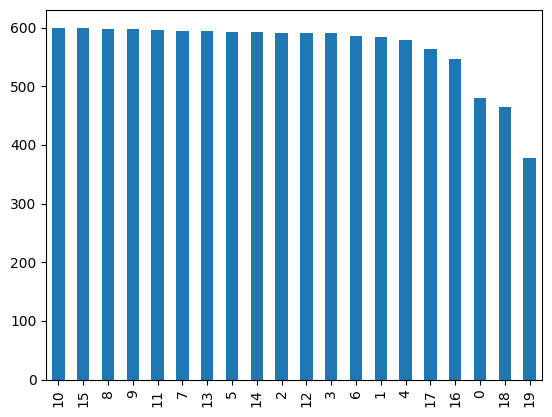

In [22]:
df['target'].value_counts().plot(kind='bar')

In [23]:
test = fetch_20newsgroups(subset='test', shuffle=True)

In [24]:
len(test)
test.data

['From: v064mb9k@ubvmsd.cc.buffalo.edu (NEIL B. GANDLER)\nSubject: Need info on 88-89 Bonneville\nOrganization: University at Buffalo\nLines: 10\nNews-Software: VAX/VMS VNEWS 1.41\nNntp-Posting-Host: ubvmsd.cc.buffalo.edu\n\n\n I am a little confused on all of the models of the 88-89 bonnevilles.\nI have heard of the LE SE LSE SSE SSEI. Could someone tell me the\ndifferences are far as features or performance. I am also curious to\nknow what the book value is for prefereably the 89 model. And how much\nless than book value can you usually get them for. In other words how\nmuch are they in demand this time of year. I have heard that the mid-spring\nearly summer is the best time to buy.\n\n\t\t\tNeil Gandler\n',
 'From: Rick Miller <rick@ee.uwm.edu>\nSubject: X-Face?\nOrganization: Just me.\nLines: 17\nDistribution: world\nNNTP-Posting-Host: 129.89.2.33\nSummary: Go ahead... swamp me.  <EEP!>\n\nI\'m not familiar at all with the format of these "X-Face:" thingies, but\nafter seeing them 

In [25]:
train_article = df['article']
train_target = df['target']

In [26]:
test_article = test.data
test_target = test.target

In [27]:
len(train_article)

11314

In [28]:
len(train_target)

11314

In [29]:
len(test_article)

7532

In [30]:
len(test_target)

7532

In [31]:
def preprocessing_data(trainData, testData, ty):
    tok = Tokenizer(num_words=10000)
    tok.fit_on_texts(trainData)
    xtrain = tok.texts_to_matrix(trainData, mode=ty)
    xtest = tok.texts_to_matrix(testData, mode=ty)
    return xtrain, xtest, tok.index_word

In [32]:
xtrain, xtest, indexWord = preprocessing_data(train_article, test_article, "binary")

In [33]:
xtrain.shape

(11314, 10000)

In [34]:
xtest.shape

(7532, 10000)

In [35]:
xtrain[0]

array([0., 1., 1., ..., 0., 0., 0.])

In [36]:
indexWord

{1: 'the',
 2: 'to',
 3: 'of',
 4: 'a',
 5: "'ax",
 6: 'and',
 7: 'in',
 8: 'i',
 9: 'is',
 10: 'that',
 11: 'it',
 12: 'for',
 13: 'you',
 14: 'from',
 15: 'edu',
 16: 'on',
 17: 'this',
 18: 'be',
 19: 'are',
 20: 'not',
 21: 'have',
 22: 'with',
 23: 'as',
 24: '1',
 25: 'or',
 26: 'was',
 27: 'if',
 28: 'but',
 29: 'subject',
 30: 'they',
 31: 'com',
 32: 'lines',
 33: 'at',
 34: 'organization',
 35: 'by',
 36: '2',
 37: 'an',
 38: 'my',
 39: 'can',
 40: 'x',
 41: '3',
 42: 'what',
 43: '0',
 44: 'all',
 45: 'will',
 46: 'm',
 47: 'there',
 48: 'would',
 49: 'one',
 50: 'do',
 51: "'",
 52: 'about',
 53: 're',
 54: 'we',
 55: 'writes',
 56: 'so',
 57: 'he',
 58: 'your',
 59: 'no',
 60: 'has',
 61: 'article',
 62: 'any',
 63: 'me',
 64: 'some',
 65: 'who',
 66: 'out',
 67: 'which',
 68: '4',
 69: 'q',
 70: 'more',
 71: 'like',
 72: 'people',
 73: "don't",
 74: 'when',
 75: '5',
 76: 'just',
 77: 'university',
 78: 'posting',
 79: 'their',
 80: 'were',
 81: 'up',
 82: 'r',
 83: 'p',


xtrain, train_target 데이터를 신경망으로 학습하여 분류모델을 생성 ->  
xtest 데이터를 모델에 입력하여 분류 (20가지)결과와 test_target을 비교하여 정확도를 개선

In [37]:
train_target

0         7
1         4
2         4
3         1
4        14
         ..
11309    13
11310     4
11311     3
11312     1
11313     8
Name: target, Length: 11314, dtype: int64

In [38]:
y_train = to_categorical(train_target, 20)
y_test = to_categorical(test_target, 20)

In [39]:
y_train

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [40]:
y_train.shape

(11314, 20)

In [43]:
# 신경망 모델
mymodel = Sequential()
mymodel.add(Dense(256, input_shape=(10000,), activation='relu'))
mymodel.add(Dense(128, activation='relu'))
mymodel.add(Dense(20, activation='softmax'))

mymodel.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy']) # <- 모델 옵션 설정

mymodel.fit(xtrain, y_train, batch_size=128, epochs=5, verbose=1, validation_split=0.1) # <- 실제 학습

score = mymodel.evaluate(xtest, y_test, batch_size=128, verbose=0)
print(f"정확도 : {score[1]}")

Epoch 1/5
80/80 [==============================] - 2s 10ms/step - loss: 1.2705 - accuracy: 0.7213 - val_loss: 0.4608 - val_accuracy: 0.8869
Epoch 2/5
80/80 [==============================] - 1s 7ms/step - loss: 0.1893 - accuracy: 0.9630 - val_loss: 0.3697 - val_accuracy: 0.8958
Epoch 3/5
80/80 [==============================] - 1s 7ms/step - loss: 0.0591 - accuracy: 0.9939 - val_loss: 0.3071 - val_accuracy: 0.9081
Epoch 4/5
80/80 [==============================] - 1s 7ms/step - loss: 0.0238 - accuracy: 0.9984 - val_loss: 0.2950 - val_accuracy: 0.9134
Epoch 5/5
80/80 [==============================] - 1s 7ms/step - loss: 0.0144 - accuracy: 0.9988 - val_loss: 0.2982 - val_accuracy: 0.9108
정확도 : 0.8189060091972351
